<a href="https://colab.research.google.com/github/littlebiggeo/csdms-clinic-2020/blob/master/csdms_2020_hrt_part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HRT Data-Model Integration Workshop
# Virtual "CSDMS 2020- Linking Ecosphere and Geosphere". May 20th, 2010

---


### John M. Swartz and Paola Passalacqua: The University of Texas at Austin

### Part 2: Use of ANUGA in Flood Modeling

**Modeling flooding in the San Luis Mountains** 

We will now experiment with ANUGA, an open source hydraulic modeling tool, to observe the evolution of very unrealistic flood in the northern portion of our previous study area. We will be guided by our previously extracted channel network as well as our high-resolution topography data

![ANUGA domain](https://drive.google.com/uc?id=193oZd08UVS5mToLszf50CMDVSRn4DaBp)

Our modeling domain is approximately 1250x650m

6 synthetic gauge locations have been chosen to help us observe the evolution of the flood as we run the model.

**This notebook and exercise was inspired by Stephen Roberts of Australia National University and his ANUGA clinic held at CSDMS 2018**

We have modified portions of his deployment to illustrate the effect of surface resolution and parameters on numerical modeling of flood propagation.

For more information on ANUGA:
https://github.com/stoiver/anuga_core

For the CSDMS 2018 clinic, which is highly informative and goes into far more detail than we will here:
https://github.com/stoiver/anuga-clinic-2018



## Install necessary libraries

We will begin by cloning our github repository and installing all necessary libraries, similar to Part 1.

In [2]:
try:
  # On colab we can install all the packages we need via the notebook
  #
  # First download the clinic repository
  import os
  os.chdir('/content')
  !git clone https://github.com/littlebiggeo/csdms-clinic-2020.git

  # Now install environment using tool
  !/bin/bash /content/csdms-clinic-2020/anuga/install_anuga.sh
 
except:
  pass

if not 'workbookDir' in globals():
    workbookDir = os.getcwd()

import sys
sys.path.append(os.path.join(workbookDir,"csdms-clinic-2020"))

Cloning into 'csdms-clinic-2020'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 300 (delta 31), reused 0 (delta 0), pack-reused 233
Receiving objects: 100% (300/300), 51.79 MiB | 11.18 MiB/s, done.
Resolving deltas: 100% (93/93), done.
(1) Install netcdf
(2) Install gdal
(3) Download anuga_core github repository
(4) Install anuga
(5) Ready!


Next, we import ANUGA

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import anuga

%matplotlib inline

# Allow inline jshtml animations
from matplotlib import rc
rc('animation', html='jshtml')

## Import our DEM and extent polygons

The inputs necessary for this exercise are a DEM and bounding polygons defining areas of interest.

We have provided a 1m DEM in .asc form from our previous exercise, as well as a bounding polygon of the modeling domain and a smaller polygon surrounding the main stream within our domain.

We also define our spatial resolution for each domain.

Here we have chosen 150m^2 for the main extent and 25 m^2 for the area surrounding the channel

In [0]:
data_dir = '/content/csdms-clinic-2020/data/sanluis'

# Polygon defining broad area of interest
bounding_polygon = anuga.read_polygon(os.path.join(data_dir,'extent.csv'))


# Polygon defining particular area of interest
channel_polygon = anuga.read_polygon(os.path.join(data_dir,'channel.csv'))


# Elevation Data
topography_file = os.path.join(data_dir,'dem1.asc')


# Resolution for most of the mesh
base_resolution = 100.0  # m^2

# Resolution in particular area of interest 
channel_resolution = 25.0 # m^2

interior_regions = [[channel_polygon, channel_resolution]]

## Create the unstructured mesh for the domain


We build our triangular irregular mesh using the previously defined regional polygons and the specified resolutions.

Here we set the name of our .sww file, which is a version of netcdf that will store our model output and allow us to query details about the flood evolution.

Figure files for each frame will be stored in _plot


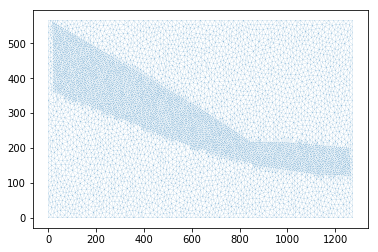

In [23]:
domain = anuga.create_domain_from_regions(
            bounding_polygon,
            boundary_tags={'bottom': [0],
                           'right':  [1],
                           'top':    [2],
                           'left':   [3]},
            maximum_triangle_area=base_resolution,
            interior_regions=interior_regions)


domain.set_name('sanluis') # Name of sww file
dplotter = anuga.Domain_plotter(domain)  
plt.triplot(dplotter.triang, linewidth = 0.1);

## Setup Initial Conditions

We must choose friction and stage values and populate our mesh with elevation. In this case we will do this using the DEM file `dem1.asc` .



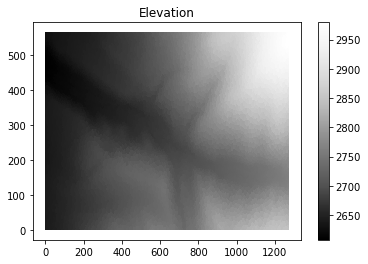

In [24]:
domain.set_quantity('elevation', filename=topography_file, location='centroids') # Use function for elevation
domain.set_quantity('friction', 0.015, location='centroids')                     # Constant friction 
domain.set_quantity('stage', expression='elevation', location='centroids')       # Dry Bed 

plt.tripcolor(dplotter.triang, 
              facecolors = dplotter.elev, 
              cmap='Greys_r')
plt.colorbar();
plt.title("Elevation");

## Setup Boundary Conditions

The rectangular domain has 4 tagged boundaries, left, top, right and bottom. We need to set boundary conditons for each of these tagged boundaries. We can set Transmissive type BC on the outflow boundaries and reflective on the others. 

In [0]:
Br = anuga.Reflective_boundary(domain)
Bt = anuga.Transmissive_boundary(domain)

domain.set_boundary({'bottom':   Bt,
                     'right':    Bt, # outflow
                     'top':      Bt, 
                     'left':     Bt}) # outflow
                     

## Specify discharge conditions and observation station locations

We specify a constant discharge inlet at the upstream edge of the modeling domain.

To monitor the arrival of the flood wave and the evolution of stage conditions we specify a series of virtual stream gauges and set their location to the closest triangle of the domain mesh.

In [0]:
# Setup discharge inlet
center = (448046.0, 4055577.0)
radius = 5.0
region0 = anuga.Region(domain, center=center, radius=radius)
fixed_inflow = anuga.Inlet_operator(domain, region0 , Q=250)

yieldstep = 5
finaltime = 200

nt = int(finaltime/yieldstep)+1

# Gauge locations
gauge = [[447984, 4055586],  [447783, 4055597],  [447709, 4055597], [447436, 4055691],  [447070, 4055790],  [446850, 4055866], [446962, 4055948]] #Gauges 0-6
g0_id = domain.get_triangle_containing_point(gauge[0])
g1_id = domain.get_triangle_containing_point(gauge[1])
g2_id = domain.get_triangle_containing_point(gauge[2])
g3_id = domain.get_triangle_containing_point(gauge[3])
g4_id = domain.get_triangle_containing_point(gauge[4])
g5_id = domain.get_triangle_containing_point(gauge[5])
g6_id = domain.get_triangle_containing_point(gauge[6])

# Arrays to store data
meanstage = np.nan*np.ones((nt,))
g0 = np.nan*np.ones((nt,))
g1 = np.nan*np.ones((nt,))
g2 = np.nan*np.ones((nt,))
g3 = np.nan*np.ones((nt,))
g4 = np.nan*np.ones((nt,))
g5 = np.nan*np.ones((nt,))
g6 = np.nan*np.ones((nt,))


## Run the model!

We run the model for a set of yieldsteps up to the specified total duration.

We additionally append our previously defined gauge locations with the stage at each timestep to create time series of stage evolution.

Once the run is finished we will plot the depth at each timestep as an animation.

In [27]:
Stage = domain.quantities['stage'].centroid_values
k=0

for t in domain.evolve(yieldstep=5, duration=200):
    # Stage
    g0[k] = Stage[g0_id]
    g1[k] = Stage[g1_id]
    g2[k] = Stage[g2_id]
    g3[k] = Stage[g3_id]
    g4[k] = Stage[g4_id]
    g5[k] = Stage[g5_id]
    g6[k] = Stage[g6_id]

    k = k+1

    #dplotter.plot_depth_frame()
    dplotter.save_depth_frame(vmin=0.0, vmax=5.0)
    
    domain.print_timestepping_statistics()
    

    
# Read in the png files stored during the evolve loop
dplotter.make_depth_animation() 

Time = 0.0000, steps=0 (14s)
Time = 5.0000, delta t = 1000.00000000, steps=1 (1s)
Time = 10.0000, delta t in [0.04643713, 0.07766615], steps=77 (1s)
Time = 15.0000, delta t in [0.06176556, 0.07655455], steps=73 (1s)
Time = 20.0000, delta t in [0.05893284, 0.06178645], steps=83 (1s)
Time = 25.0000, delta t in [0.05230291, 0.05890739], steps=91 (1s)
Time = 30.0000, delta t in [0.05037737, 0.05227429], steps=99 (1s)
Time = 35.0000, delta t in [0.04908291, 0.05059589], steps=101 (1s)
Time = 40.0000, delta t in [0.04854303, 0.04952311], steps=102 (1s)
Time = 45.0000, delta t in [0.04923022, 0.04945910], steps=102 (1s)
Time = 50.0000, delta t in [0.04789582, 0.04922465], steps=103 (1s)
Time = 55.0000, delta t in [0.04257801, 0.04921887], steps=106 (1s)
Time = 60.0000, delta t in [0.04029943, 0.04255590], steps=120 (2s)
Time = 65.0000, delta t in [0.03908015, 0.04027630], steps=128 (2s)
Time = 70.0000, delta t in [0.03932205, 0.03977691], steps=127 (2s)
Time = 75.0000, delta t in [0.03977802,

### Plot the stage time series

![ANUGA domain](https://drive.google.com/uc?id=193oZd08UVS5mToLszf50CMDVSRn4DaBp)

In the above model run we specified a number of virtual gauge locations and recorded the stage during the flow evolution. 

We plot those timeseries below!

Note that stage is zero before the arrival of the flood, as we specified dry bed conditions. We see the stage increase rapidly and stabilize at a contant value. This remains constant through the model run as we have constant discharge inlet conditions with a perfectly transmissive downstream outlet.

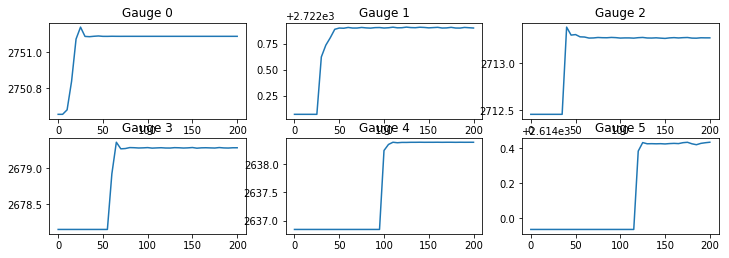

In [28]:
figsize = plt.rcParams['figure.figsize']

plt.rcParams['figure.figsize'] = [12, 6]

nt = int(200/5)+1

import scipy

tt= np.linspace(0.0,200, nt)

plt.subplot(3,3,1)
plt.plot(tt,g0)
plt.title('Gauge 0')

plt.subplot(3,3,2)
plt.plot(tt,g1)
plt.title('Gauge 1')

plt.subplot(3,3,3)
plt.plot(tt,g2)
plt.title('Gauge 2')

plt.subplot(3,3,4)
plt.plot(tt,g3)
plt.title('Gauge 3')

plt.subplot(3,3,5)
plt.plot(tt,g4)
plt.title('Gauge 4')

plt.subplot(3,3,6)
plt.plot(tt,g5)
plt.title('Gauge 5')

plt.rcParams['figure.figsize'] = figsize

## Run model again with differing friction

For the second run we have condensed the above cells to a single executable. We hold all our boundary conditions constant except for friction, which we increase to 0.03, a fairly unreasonable value.

We have kept the mesh resolutions the same, but after the clinic feel free to experiment! As a warning, smaller mesh sizes lead to increased runtimes and memory usage, which can lead to instability in Google co-lab, which is why we have chosen the values below.

Figure files for each frame will be stored in _plot


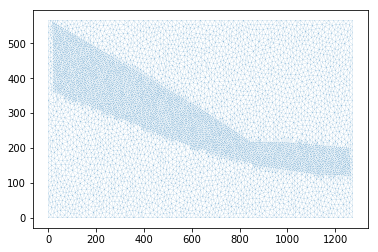

In [29]:
# Resolution for most of the mesh
base_resolution = 150.0  # m^2

# Resolution in particular area of interest 
channel_resolution = 25.0 # m^2

domain = anuga.create_domain_from_regions(
            bounding_polygon,
            boundary_tags={'bottom': [0],
                           'right':  [1],
                           'top':    [2],
                           'left':   [3]},
            maximum_triangle_area=base_resolution,
            interior_regions=interior_regions)


domain.set_name('sanluis2') # Name of sww file
dplotter = anuga.Domain_plotter(domain)  
plt.triplot(dplotter.triang, linewidth = 0.1);

# Setup Initial Conditions
domain.set_quantity('elevation', filename=topography_file, location='centroids') # Use function for elevation
domain.set_quantity('friction', 0.03, location='centroids')                        # Constant friction 
domain.set_quantity('stage', expression='elevation', location='centroids')         # Dry Bed 


# Setup boundary conditions
Br = anuga.Reflective_boundary(domain)
Bt = anuga.Transmissive_boundary(domain)

# Set domain boundary conditions
domain.set_boundary({'bottom':   Bt,
                     'right':    Bt, # outflow
                     'top':      Bt, 
                     'left':     Bt, # outflow
                     })

# Setup discharge inlet
center = (448046.0, 4055577.0)
radius = 5.0
region0 = anuga.Region(domain, center=center, radius=radius)
fixed_inflow = anuga.Inlet_operator(domain, region0 , Q=250)

yieldstep = 5
finaltime = 200

nt = int(finaltime/yieldstep)+1

# Gauge locations
gauge2 = [[447984, 4055586],  [447783, 4055597],  [447709, 4055597], [447436, 4055691],  [447070, 4055790],  [446850, 4055866], [446962, 4055948]] #Gauges 0-6
g2_0_id = domain.get_triangle_containing_point(gauge2[0])
g2_1_id = domain.get_triangle_containing_point(gauge2[1])
g2_2_id = domain.get_triangle_containing_point(gauge2[2])
g2_3_id = domain.get_triangle_containing_point(gauge2[3])
g2_4_id = domain.get_triangle_containing_point(gauge2[4])
g2_5_id = domain.get_triangle_containing_point(gauge2[5])
g2_6_id = domain.get_triangle_containing_point(gauge2[6])

# Arrays to store data
meanstage = np.nan*np.ones((nt,))
g2_0 = np.nan*np.ones((nt,))
g2_1 = np.nan*np.ones((nt,))
g2_2 = np.nan*np.ones((nt,))
g2_3 = np.nan*np.ones((nt,))
g2_4 = np.nan*np.ones((nt,))
g2_5 = np.nan*np.ones((nt,))
g2_6 = np.nan*np.ones((nt,))




Now we run the model again! This time it is being stored in a second .sww file to allow for both to be saved, compared, and used in analysis. 

ANUGA .sww files are a form of netcdf, and so can be handled and analyzed using python and matlab workflows designed for those file types.

In [30]:
Stage = domain.quantities['stage'].centroid_values
k=0

for t in domain.evolve(yieldstep=5, duration=200):
    # Stage
    g2_0[k] = Stage[g2_0_id]
    g2_1[k] = Stage[g2_1_id]
    g2_2[k] = Stage[g2_2_id]
    g2_3[k] = Stage[g2_3_id]
    g2_4[k] = Stage[g2_4_id]
    g2_5[k] = Stage[g2_5_id]
    g2_6[k] = Stage[g2_6_id]

    k = k+1

    #dplotter.plot_depth_frame()
    dplotter.save_depth_frame(vmin=0.0, vmax=3.0)
    
    domain.print_timestepping_statistics()
    

    
# Read in the png files stored during the evolve loop
dplotter.make_depth_animation() 

Time = 0.0000, steps=0 (22s)
Time = 5.0000, delta t = 1000.00000000, steps=1 (0s)
Time = 10.0000, delta t in [0.04637919, 0.07802507], steps=73 (1s)
Time = 15.0000, delta t in [0.07609106, 0.07844692], steps=65 (2s)
Time = 20.0000, delta t in [0.06660145, 0.07593289], steps=72 (1s)
Time = 25.0000, delta t in [0.06641207, 0.06717622], steps=76 (1s)
Time = 30.0000, delta t in [0.06717627, 0.06726382], steps=75 (1s)
Time = 35.0000, delta t in [0.06726397, 0.06738635], steps=75 (1s)
Time = 40.0000, delta t in [0.06433118, 0.06750959], steps=75 (1s)
Time = 45.0000, delta t in [0.06160982, 0.06421866], steps=81 (1s)
Time = 50.0000, delta t in [0.06086932, 0.06160318], steps=82 (1s)
Time = 55.0000, delta t in [0.06093472, 0.06106143], steps=82 (1s)
Time = 60.0000, delta t in [0.06002645, 0.06105275], steps=83 (1s)
Time = 65.0000, delta t in [0.05949054, 0.06002231], steps=84 (1s)
Time = 70.0000, delta t in [0.05870624, 0.05947149], steps=85 (1s)
Time = 75.0000, delta t in [0.05697015, 0.05907

We will once again plot the time series of stage from each of our virtual gauge sites, but this time from both model runs to see the effect of increasing roughness.

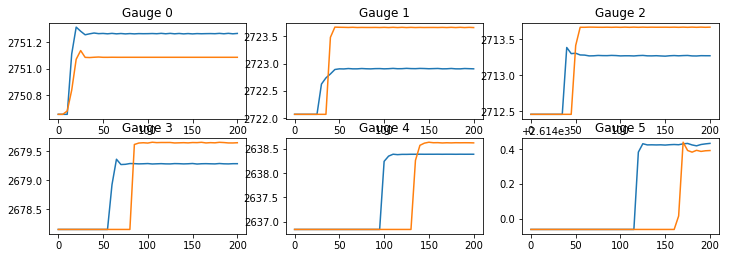

In [31]:
figsize = plt.rcParams['figure.figsize']

plt.rcParams['figure.figsize'] = [12, 6]

nt = int(200/5)+1

import scipy

tt= np.linspace(0.0,200, nt)

plt.subplot(3,3,1)
plt.plot(tt,g2_0)
plt.plot(tt,g0)
plt.title('Gauge 0')

plt.subplot(3,3,2)
plt.plot(tt,g1)
plt.plot(tt,g2_1)
plt.title('Gauge 1')

plt.subplot(3,3,3)
plt.plot(tt,g2)
plt.plot(tt,g2_2)
plt.title('Gauge 2')

plt.subplot(3,3,4)
plt.plot(tt,g3)
plt.plot(tt,g2_3)
plt.title('Gauge 3')

plt.subplot(3,3,5)
plt.plot(tt,g4)
plt.plot(tt,g2_4)
plt.title('Gauge 4')

plt.subplot(3,3,6)
plt.plot(tt,g5)
plt.plot(tt,g2_5)
plt.title('Gauge 5')

plt.rcParams['figure.figsize'] = figsize

We will run the model a final time, now with a catastrophic flood. 

As before, we have held all boundary conditions constant but changed discharge to 5000 m^3 per second for the model run.



Figure files for each frame will be stored in _plot


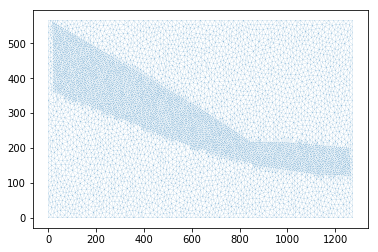

In [37]:
# Resolution for most of the mesh
base_resolution = 150.0  # m^2

# Resolution in particular area of interest 
channel_resolution = 25.0 # m^2

domain = anuga.create_domain_from_regions(
            bounding_polygon,
            boundary_tags={'bottom': [0],
                           'right':  [1],
                           'top':    [2],
                           'left':   [3]},
            maximum_triangle_area=base_resolution,
            interior_regions=interior_regions)


domain.set_name('sanluis3') # Name of sww file
dplotter = anuga.Domain_plotter(domain)  
plt.triplot(dplotter.triang, linewidth = 0.1);

# Setup Initial Conditions
domain.set_quantity('elevation', filename=topography_file, location='centroids') # Use function for elevation
domain.set_quantity('friction', 0.03, location='centroids')                        # Constant friction 
domain.set_quantity('stage', expression='elevation', location='centroids')         # Dry Bed 


# Setup boundary conditions
Br = anuga.Reflective_boundary(domain)
Bt = anuga.Transmissive_boundary(domain)

# Set domain boundary conditions
domain.set_boundary({'bottom':   Bt,
                     'right':    Bt, # outflow
                     'top':      Bt, 
                     'left':     Bt, # outflow
                     })

# Setup discharge inlet
center = (448046.0, 4055577.0)
radius = 5.0
region0 = anuga.Region(domain, center=center, radius=radius)
fixed_inflow = anuga.Inlet_operator(domain, region0 , Q=5000)

yieldstep = 5
finaltime = 200

nt = int(finaltime/yieldstep)+1

# Gauge locations
gauge3 = [[447984, 4055586],  [447783, 4055597],  [447709, 4055597], [447436, 4055691],  [447070, 4055790],  [446850, 4055866], [446962, 4055948]] #Gauges 0-6
g3_0_id = domain.get_triangle_containing_point(gauge3[0])
g3_1_id = domain.get_triangle_containing_point(gauge3[1])
g3_2_id = domain.get_triangle_containing_point(gauge3[2])
g3_3_id = domain.get_triangle_containing_point(gauge3[3])
g3_4_id = domain.get_triangle_containing_point(gauge3[4])
g3_5_id = domain.get_triangle_containing_point(gauge3[5])
g3_6_id = domain.get_triangle_containing_point(gauge3[6])

# Arrays to store data
meanstage = np.nan*np.ones((nt,))
g3_0 = np.nan*np.ones((nt,))
g3_1 = np.nan*np.ones((nt,))
g3_2 = np.nan*np.ones((nt,))
g3_3 = np.nan*np.ones((nt,))
g3_4 = np.nan*np.ones((nt,))
g3_5 = np.nan*np.ones((nt,))
g3_6 = np.nan*np.ones((nt,))


Run the model for 200 seconds, recording stage at our virtual gauges and plotting the evolution of flow depth.

In [38]:
Stage = domain.quantities['stage'].centroid_values
k=0

for t in domain.evolve(yieldstep=5, duration=200):
    # Stage
    g3_0[k] = Stage[g3_0_id]
    g3_1[k] = Stage[g3_1_id]
    g3_2[k] = Stage[g3_2_id]
    g3_3[k] = Stage[g3_3_id]
    g3_4[k] = Stage[g3_4_id]
    g3_5[k] = Stage[g3_5_id]
    g3_6[k] = Stage[g3_6_id]

    k = k+1

    #dplotter.plot_depth_frame()
    dplotter.save_depth_frame(vmin=0.0, vmax=10.0)
    
    domain.print_timestepping_statistics()
    

    
# Read in the png files stored during the evolve loop
dplotter.make_depth_animation() 

Time = 0.0000, steps=0 (7s)
Time = 5.0000, delta t = 1000.00000000, steps=1 (0s)
Time = 10.0000, delta t in [0.01093595, 0.03311000], steps=246 (3s)
Time = 15.0000, delta t in [0.03240099, 0.03314090], steps=152 (2s)
Time = 20.0000, delta t in [0.03253774, 0.03318051], steps=152 (3s)
Time = 25.0000, delta t in [0.02870773, 0.03253519], steps=164 (2s)
Time = 30.0000, delta t in [0.02692549, 0.02868629], steps=183 (2s)
Time = 35.0000, delta t in [0.02651228, 0.02697003], steps=186 (3s)
Time = 40.0000, delta t in [0.02522170, 0.02648846], steps=197 (3s)
Time = 45.0000, delta t in [0.02515526, 0.02531660], steps=199 (3s)
Time = 50.0000, delta t in [0.02498449, 0.02516294], steps=200 (3s)
Time = 55.0000, delta t in [0.02477118, 0.02498382], steps=202 (3s)
Time = 60.0000, delta t in [0.02444911, 0.02477885], steps=203 (3s)
Time = 65.0000, delta t in [0.02398400, 0.02444649], steps=207 (3s)
Time = 70.0000, delta t in [0.02347177, 0.02398294], steps=211 (3s)
Time = 75.0000, delta t in [0.02315

We plot a final series of gauge figures, now with the results of all three of our model runs.

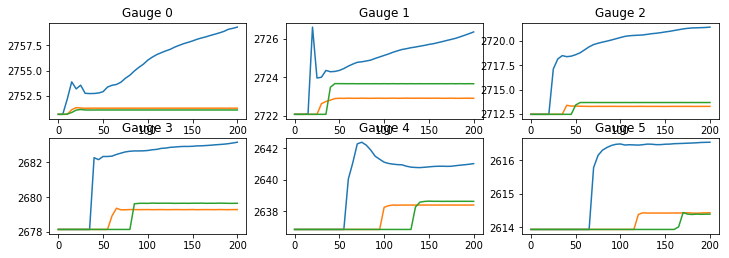

In [39]:
figsize = plt.rcParams['figure.figsize']

plt.rcParams['figure.figsize'] = [12, 6]

nt = int(200/5)+1

import scipy

tt= np.linspace(0.0,200, nt)

plt.subplot(3,3,1)
plt.plot(tt,g3_0)
plt.plot(tt,g2_0)
plt.plot(tt,g0)
plt.title('Gauge 0')

plt.subplot(3,3,2)
plt.plot(tt,g3_1)
plt.plot(tt,g1)
plt.plot(tt,g2_1)
plt.title('Gauge 1')

plt.subplot(3,3,3)
plt.plot(tt,g3_2)
plt.plot(tt,g2)
plt.plot(tt,g2_2)
plt.title('Gauge 2')

plt.subplot(3,3,4)
plt.plot(tt,g3_3)
plt.plot(tt,g3)
plt.plot(tt,g2_3)
plt.title('Gauge 3')

plt.subplot(3,3,5)
plt.plot(tt,g3_4)
plt.plot(tt,g4)
plt.plot(tt,g2_4)
plt.title('Gauge 4')

plt.subplot(3,3,6)
plt.plot(tt,g3_5)
plt.plot(tt,g5)
plt.plot(tt,g2_5)
plt.title('Gauge 5')

plt.rcParams['figure.figsize'] = figsize

## SWW File

Plot maximum depth and speed at the last time slice of the .sww file

Figure files for each frame will be stored in _plot


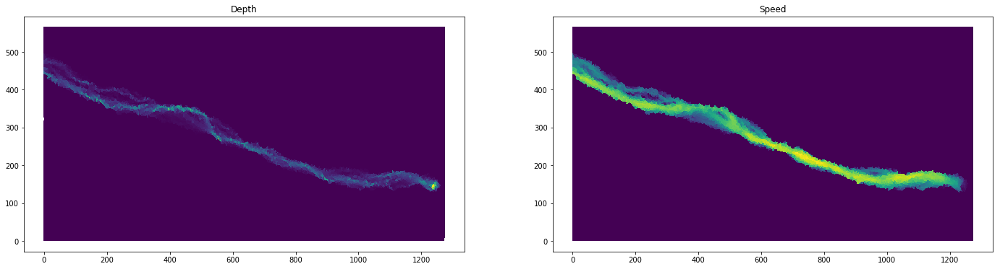

In [0]:
# Create a wrapper for contents of sww file
swwfile = 'sanluis.sww'
splotter = anuga.SWW_plotter(swwfile)


# Plot Depth and Speed at the last time slice
plt.figure(figsize=(24, 6))
plt.subplot(121)
splotter.triang.set_mask(None)
plt.tripcolor(splotter.triang, 
              facecolors = splotter.depth[-1,:], 
              cmap='viridis')

plt.title("Depth")


plt.subplot(122)
splotter.triang.set_mask(None)
plt.tripcolor(splotter.triang, 
              facecolors = splotter.speed[-1,:], 
              cmap='viridis')

plt.title("Speed");
